<a href="https://colab.research.google.com/github/mahima124/githubtest/blob/main/Copy_of_movingelectrons_modified_TSI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

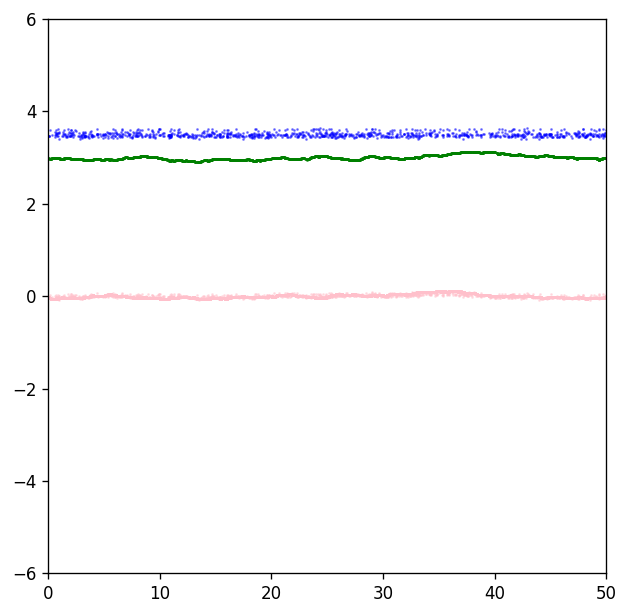

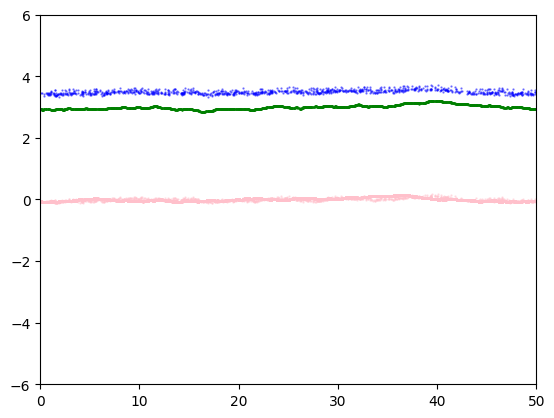

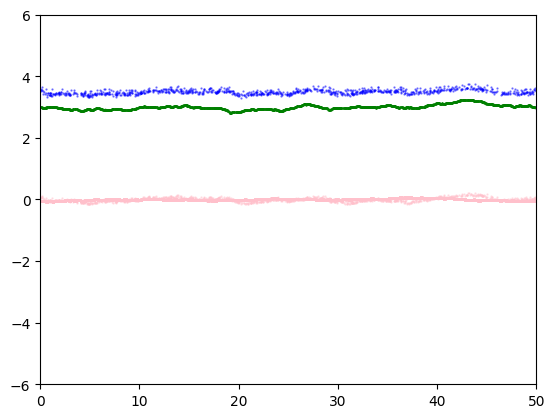

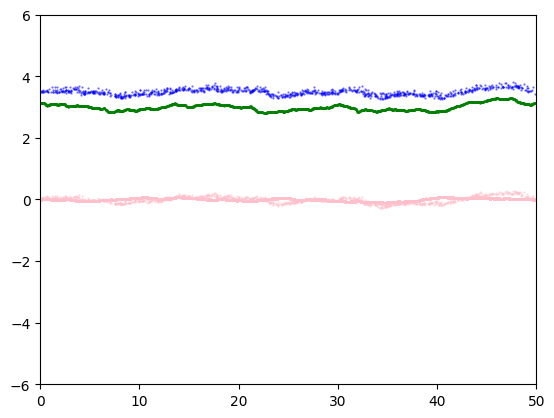

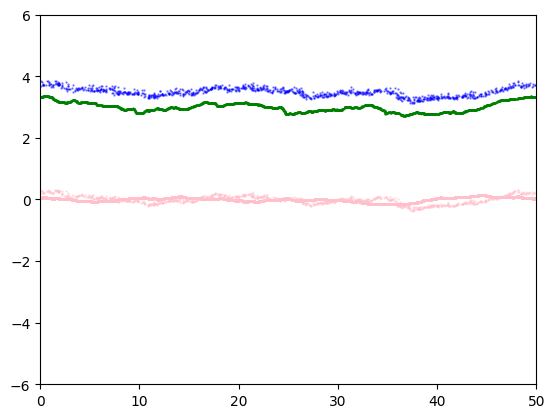

...

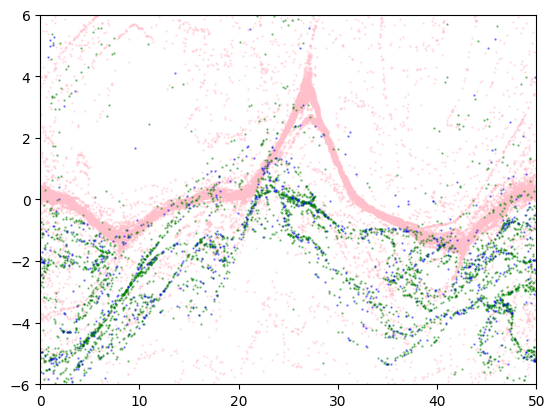

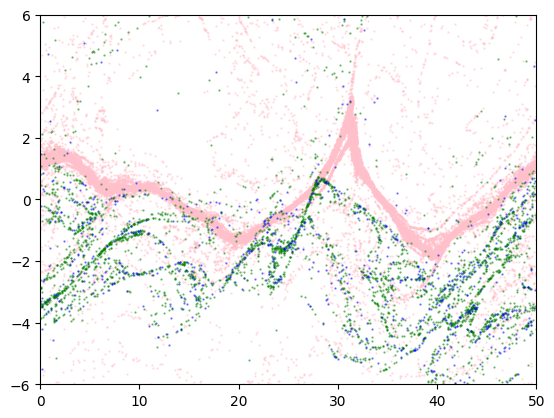

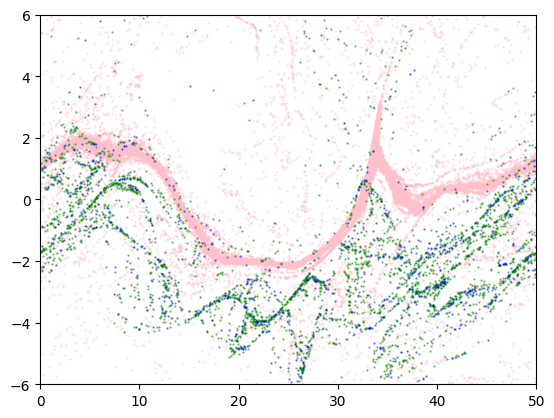

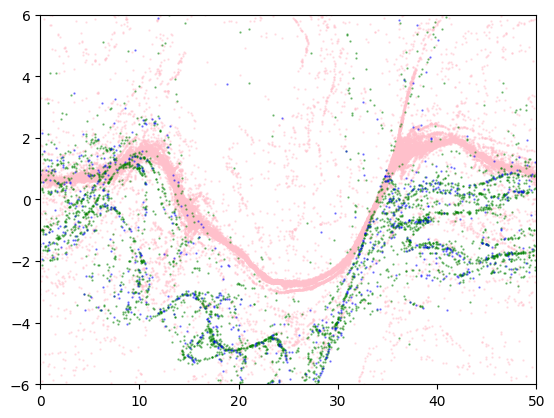

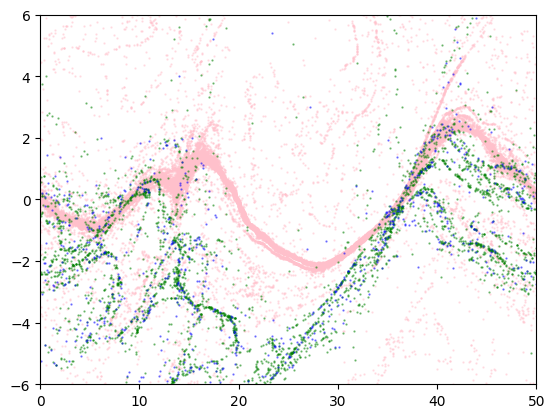

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.sparse as sp
from scipy.sparse.linalg import spsolve

def getAcc(pos, Nx, boxsize, n0, Gmtx, Lmtx):
    N = pos.shape[0]
    dx = boxsize / Nx
    j = np.floor(pos / dx).astype(int)
    jp1 = j + 1
    weight_j = (jp1 * dx - pos) / dx
    weight_jp1 = (pos - j * dx) / dx
    jp1 = np.mod(jp1, Nx)
    n = np.bincount(j[:, 0], weights=weight_j[:, 0], minlength=Nx)
    n += np.bincount(jp1[:, 0], weights=weight_jp1[:, 0], minlength=Nx)
    n *= n0 * boxsize / N / dx

    phi_grid = spsolve(Lmtx, n - n0, permc_spec="MMD_AT_PLUS_A")
    E_grid = -Gmtx @ phi_grid
    E = weight_j * E_grid[j] + weight_jp1 * E_grid[jp1]
    a = -E
    #print(E)

    return a

def main():
    N = 40000
    Nx = 400
    t = 0
    tEnd = 500
    dt = 1
    boxsize = 50
    n0 = 1
    vb = 3.5
    vth = 1
    A = 0.1
    hot_electron_percentage = 10

    plotRealTime = True

    np.random.seed(42)
    pos = np.random.rand(N, 1) * boxsize
    Nh_hot_stationary = int(N * (100 - hot_electron_percentage) / 100)
    Nh_hot_moving = N - Nh_hot_stationary

    # Set velocities for stationary electrons
    vel_stationary = np.zeros((Nh_hot_stationary, 1))

    # Set velocities for 10% moving electrons with velocity 3eV
    vel_moving = 3.0 * np.ones((Nh_hot_moving, 1))

    # Set velocities for the beam (different number of particles)
    N_beam = 1000  # Adjust the number of particles in the beam
    pos_beam = np.random.rand(N_beam, 1) * boxsize
    vel_beam = vb * np.ones((N_beam, 1))

    dx = boxsize / Nx
    e = np.ones(Nx)
    diags = np.array([-1, 1])
    vals = np.vstack((-e, e))
    Gmtx = sp.spdiags(vals, diags, Nx, Nx)
    Gmtx = sp.lil_matrix(Gmtx)
    Gmtx[0, Nx - 1] = -1
    Gmtx[Nx - 1, 0] = 1
    Gmtx /= (2 * dx)
    Gmtx = sp.csr_matrix(Gmtx)

    diags = np.array([-1, 0, 1])
    vals = np.vstack((e, -2 * e, e))
    Lmtx = sp.spdiags(vals, diags, Nx, Nx)
    Lmtx = sp.lil_matrix(Lmtx)
    Lmtx[0, Nx - 1] = 1
    Lmtx[Nx - 1, 0] = 1
    Lmtx /= dx**2
    Lmtx = sp.csr_matrix(Lmtx)

    acc = getAcc(pos, Nx, boxsize, n0, Gmtx, Lmtx)
    Nt = int(np.ceil(tEnd / dt))

    fig = plt.figure(figsize=(6, 6), dpi=120)

    for i in range(Nt):
        vel_stationary += acc[:Nh_hot_stationary] * dt / 2.0
        pos[:Nh_hot_stationary] += vel_stationary * dt

        acc_moving = acc[Nh_hot_stationary:Nh_hot_stationary + Nh_hot_moving]
        vel_moving += acc_moving * dt / 2.0
        pos[Nh_hot_stationary:Nh_hot_stationary + Nh_hot_moving] += vel_moving * dt

        # Update velocities for the beam
        acc_beam = acc[Nh_hot_moving:Nh_hot_moving + N_beam]
        vel_beam += acc_beam * dt / 2.0

        # Update positions for the beam
        pos_beam += vel_beam * dt

        # Ensure the beam particles are within the box
        pos_beam = np.mod(pos_beam, boxsize)

        # Copy the beam particles back to the main position array
        pos[Nh_hot_moving:Nh_hot_moving + N_beam] = pos_beam
        # Concatenate positions and velocities
        pos = np.concatenate((pos[:Nh_hot_stationary], pos[Nh_hot_stationary:Nh_hot_stationary + Nh_hot_moving], pos_beam))
        vel = np.concatenate((vel_stationary, vel_moving, vel_beam))

        pos = np.mod(pos, boxsize)

        acc = getAcc(pos, Nx, boxsize, n0, Gmtx, Lmtx)

        vel_stationary += acc[:Nh_hot_stationary] * dt / 2.0
        vel_moving += acc_moving * dt / 2.0
        vel_beam += acc_beam * dt / 2.0
        t += dt

        if plotRealTime or (i == Nt - 1):
            plt.cla()

            # Plot stationary electrons in pink
            plt.scatter(pos[:Nh_hot_stationary], vel_stationary, s=0.4, color='pink', alpha=0.5)

            # Plot moving electrons in green
            plt.scatter(pos[Nh_hot_stationary:Nh_hot_stationary + Nh_hot_moving], vel_moving, s=0.4, color='green', alpha=0.5)

            # Plot beam in blue
            plt.scatter(pos[Nh_hot_stationary + Nh_hot_moving:], vel_beam, s=0.4, color='blue', alpha=0.5)

            plt.axis([0, boxsize, -6, 6])

            plt.pause(0.001)



    plt.xticks(fontweight='bold', fontsize=20)
    plt.yticks(fontweight='bold', fontsize=20)
    plt.xlabel('x', fontweight='bold', fontsize=25)
    plt.ylabel('v', fontweight='bold', fontsize=25)
    plt.savefig('pic.png', dpi=240)
    plt.show()

    return 0

if __name__ == "__main__":
    main()